## IMPORT LIBRARIES

In [ ]:
import tensorflow as tf
import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
from IPython import display
!pip install mat73
import mat73
import numpy as np
from tensorflow import keras
from tensorflow.keras.optimizers import Adam

from google.colab import drive
drive.mount('/content/drive')

MON='01'
monidx=int(MON)-1


Mounted at /content/drive


:# LOAD ORIGINAL TRAINING DATA 2016-2021

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
n=5000
import random

fn= f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/MW_cal{MON}.mat'
mat = mat73.loadmat(fn)['MW']
selectindex=random.sample(range(0, mat.shape[2]), n)
ytrain = np.zeros([n,512,1536], dtype=np.single)
for i in range(n):
   ytrain[i,:,:]=mat[:,:,selectindex[i]]
mat=[]

In [ ]:
fn= f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/IR_cal{MON}.mat'
mat = mat73.loadmat(fn)['IR']
xtrain1 = np.zeros([n,512,1536], dtype=np.uint8)
for i in range(n):
   xtrain1[i,:,:]=mat[:,:,selectindex[i]]
mat=[]

In [ ]:
from scipy import ndimage, misc
fn= f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/RAIN_{MON}.mat'
mat = mat73.loadmat(fn)['RAIN']
xtrain2 = np.reshape(mat,[1,512,1536])
xtrain2 = np.repeat(xtrain2, n, axis=0)
xtrain2.shape

(5000, 512, 1536)

In [ ]:
dataset=np.stack([xtrain1,xtrain2,ytrain],-1)
print(dataset.shape)

(5000, 512, 1536, 3)


In [ ]:
xtrain1,xtrain2,ytrain=[],[],[]

In [ ]:
train_size =4000
test_size =1000
train= dataset[:train_size,...]
test = dataset[train_size:train_size+test_size,...]

np.save(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/train_dataset{MON}.npy',train)
np.save(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/test_dataset{MON}.npy',test)
dataset=[]

# LOAD PROCESSED TRAINING DATA



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
## New Pipeline (disconect the runtime and run this pipline instead of old pipeline to compare)
train = np.load(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/train_dataset{MON}.npy')
test = np.load(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/test_dataset{MON}.npy')
print(train.shape)

(4000, 512, 1536, 3)


In [ ]:
BATCH_SIZE = 8
def data_generator(data):
    for i in range(data.shape[0]):
        yield data[i]

def load(input):
  input_image = tf.convert_to_tensor(tf.reshape((input[...,0:2]-1)/254.0,[512,1536,2]))
  real_image = tf.convert_to_tensor(tf.reshape(input[...,2],[512,1536,1]))
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)
  return input_image, real_image

def load_image_train(image_file):
  input_image, real_image = load(image_file)
  return input_image, real_image

def load_image_test(image_file):
  input_image, real_image = load(image_file)
  return input_image, real_image

train_dataset = tf.data.Dataset.from_generator(lambda: data_generator(train), output_types=tf.float32)
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.batch(BATCH_SIZE)
train_dataset = train_dataset.prefetch(tf.data.AUTOTUNE)

test_dataset = tf.data.Dataset.from_generator(lambda: data_generator(test), output_types=tf.float32)
test_dataset = test_dataset.map(load_image_test, num_parallel_calls=tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(BATCH_SIZE)

Instructions for updating:
Use output_signature instead


In [ ]:
test_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 512, 1536, 2), dtype=tf.float32, name=None), TensorSpec(shape=(None, 512, 1536, 1), dtype=tf.float32, name=None))>

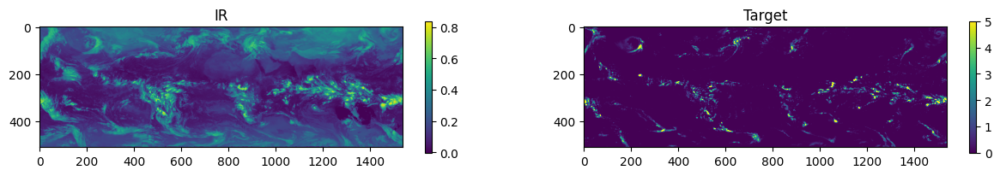

-0.001


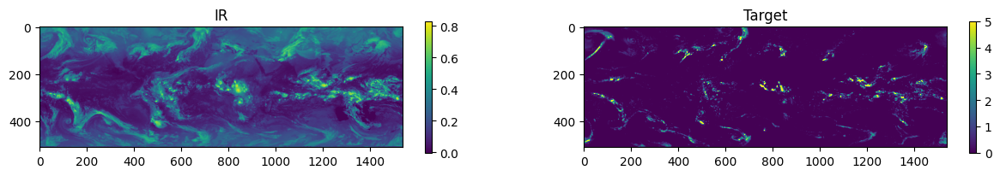

-0.001


In [ ]:
##Display images
for input_image, target_image in test_dataset.take(2):
    # Display the input and target images side-by-side
    fig = plt.figure(figsize=(15, 2))
    plt.subplot(1, 2, 1)
    plt.imshow(input_image[0,...,0])
    plt.title('IR')
    plt.colorbar()
    plt.subplot(1, 2, 2)
    plt.imshow(target_image[0,...,0])
    plt.title('Target')
    plt.colorbar()
    plt.clim(0,5)
    plt.show()
    print(np.min(target_image[0,...,0]))

##BUILD THE UNET MODEL

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, BatchNormalization
from tensorflow.keras.models import Model

# Define the input shape for 2D data with 2 channels
input_shape = (512, 1536, 2)

# Define input layer
input_data = Input(shape=input_shape, name='input_data')

# U-Net Encoder
conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(input_data)
conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

# Bottleneck layer
conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)

# U-Net Decoder
up3 = UpSampling2D(size=(2, 2))(conv4)
up3 = concatenate([conv3, up3], axis=-1)
conv5 = Conv2D(256, (3, 3), activation='relu', padding='same')(up3)
conv5 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv5)

up2 = UpSampling2D(size=(2, 2))(conv5)
up2 = concatenate([conv2, up2], axis=-1)
conv6 = Conv2D(128, (3, 3), activation='relu', padding='same')(up2)
conv6 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv6)

up1 = UpSampling2D(size=(2, 2))(conv6)
up1 = concatenate([conv1, up1], axis=-1)
conv7 = Conv2D(64, (3, 3), activation='relu', padding='same')(up1)
conv7 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv7)

# Output layer for precipitation rate estimation
output_data = Conv2D(1, (1, 1), activation='linear')(conv7)

# Define the model
model = Model(inputs=input_data, outputs=output_data)

# Compile the model (choose an appropriate optimizer and loss function)
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0003)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

## TRAIN THE UNET MODEL

In [ ]:
history = model.fit(train_dataset, validation_data=test_dataset, epochs=100,batch_size=8)

Epoch 1/100
500/500 [==============================] - 363s 620ms/step - loss: 0.3246 - mae: 0.1494 - val_loss: 0.2793 - val_mae: 0.1365
Epoch 2/100
500/500 [==============================] - 308s 617ms/step - loss: 0.2726 - mae: 0.1318 - val_loss: 0.2608 - val_mae: 0.1266
Epoch 3/100
500/500 [==============================] - 309s 618ms/step - loss: 0.2526 - mae: 0.1262 - val_loss: 0.2451 - val_mae: 0.1281
Epoch 4/100
500/500 [==============================] - 309s 619ms/step - loss: 0.2354 - mae: 0.1217 - val_loss: 0.2329 - val_mae: 0.1249
Epoch 5/100
500/500 [==============================] - 307s 614ms/step - loss: 0.2207 - mae: 0.1181 - val_loss: 0.2240 - val_mae: 0.1223
Epoch 6/100
500/500 [==============================] - 306s 612ms/step - loss: 0.2086 - mae: 0.1153 - val_loss: 0.2166 - val_mae: 0.1168
Epoch 7/100
500/500 [==============================] - 307s 614ms/step - loss: 0.2016 - mae: 0.1136 - val_loss: 0.2153 - val_mae: 0.1121
Epoch 8/100
500/500 [====================

In [ ]:
model.save(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Models/UnetGlobal_Model{MON}.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


## PLOT THE LEARNING CURVE

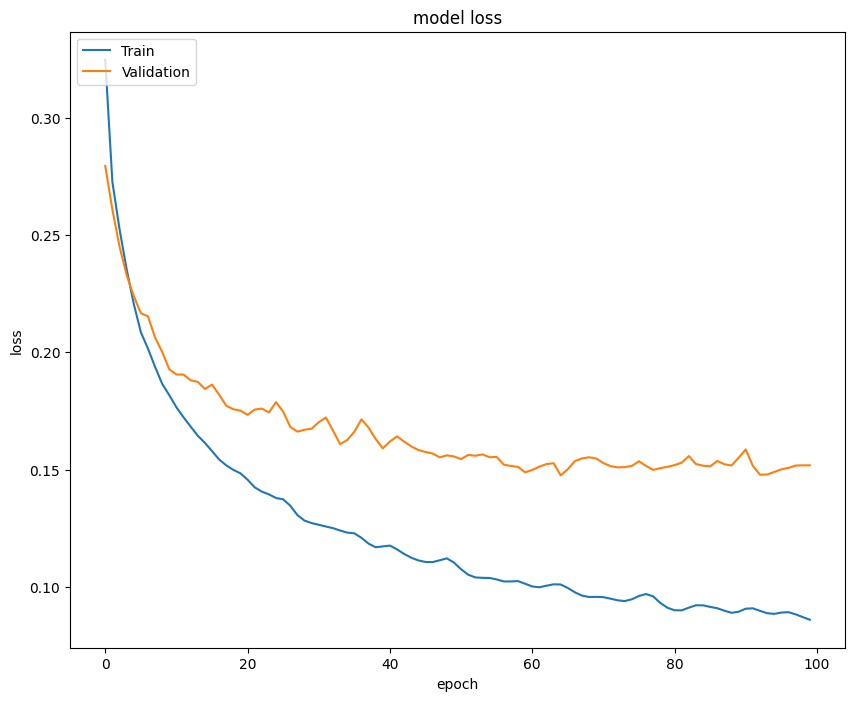

In [ ]:
# Get training and test loss histories
training_loss = history.history['loss']
test_loss = history.history['val_loss']
# Create count of the number of epochs
epoch_count = range(1, len(training_loss) + 1)

# summarize history for loss
plt.figure(figsize=(10,8))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.ylim()
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
from google.colab import runtime
runtime.unassign()

## TEST SOME PRELIMARY RESULTS WITH TEST DATASET

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# load model
import keras
model=keras.models.load_model(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Models/UnetGlobal_Model{MON}.h5')


In [ ]:
import numpy as np
test = np.load(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/test_dataset{MON}.npy')

In [ ]:
test=test[0:500,...]

In [ ]:
BATCH_SIZE = 1
def data_generator(data):
    for i in range(data.shape[0]):
        yield data[i]

def load(input):
  input_image = tf.convert_to_tensor(tf.reshape((input[...,0:2]-1)/254.0,[512,1536,2]))
  real_image = tf.convert_to_tensor(tf.reshape(input[...,2],[512,1536,1]))
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)
  return input_image, real_image

def load_image_train(image_file):
  input_image, real_image = load(image_file)
  return input_image, real_image

def load_image_test(image_file):
  input_image, real_image = load(image_file)
  return input_image, real_image

test_dataset = tf.data.Dataset.from_generator(lambda: data_generator(test), output_types=tf.float32)
test_dataset = test_dataset.map(load_image_test, num_parallel_calls=tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [ ]:
import numpy as np
# Evaluate the model with the test dataset
loss, mae = model.evaluate(test_dataset, verbose=0)

# Calculate the correlation coefficient
y_true = []  # Ground truth precipitation rates
y_pred = []  # Predicted precipitation rates

for input_image, real_image in test_dataset:
    predictions = model.predict([input_image],  verbose=0)
    y_true.extend(real_image.numpy().flatten())
    y_pred.extend(predictions.flatten())

corr_coefficient = np.corrcoef(y_true, y_pred)[0, 1]
print(f"Test Loss (MSE): {loss}, MAE: {mae}, Correlation: {corr_coefficient}")

Test Loss (MSE): 0.15227550268173218, MAE: 0.0952053964138031, Correlation: 0.8312742119831342


In [ ]:
# Set a precipitation threshold (e.g., 0.5) to convert predictions to binary values
threshold = 0.1

# Convert predictions to binary using the threshold
y_pred_binary = [1 if pred >= threshold else 0 for pred in y_pred]
y_true_binary = [1 if ytrue >= threshold else 0 for ytrue in y_true]

# Calculate True Positives (TP), False Positives (FP), True Negatives (TN), and False Negatives (FN)
TP = sum((y_true_binary[i] == 1) and (y_pred_binary[i] == 1) for i in range(len(y_true)))
FP = sum((y_true_binary[i] == 0) and (y_pred_binary[i] == 1) for i in range(len(y_true)))
TN = sum((y_true_binary[i] == 0) and (y_pred_binary[i] == 0) for i in range(len(y_true)))
FN = sum((y_true_binary[i] == 1) and (y_pred_binary[i] == 0) for i in range(len(y_true)))

# Calculate Probability of Detection (POD), False Alarm Ratio (FAR), and Critical Success Index (CSI)
POD = TP / (TP + FN)
FAR = FP / (FP + TP)
CSI = TP / (TP + FN + FP)

print(f"Test Loss (MSE): {loss}, Test MAE: {mae}, Correlation: {corr_coefficient}")
print(f"Probability of Detection (POD): {POD}")
print(f"False Alarm Ratio (FAR): {FAR}")
print(f"Critical Success Index (CSI): {CSI}")

Test Loss (MSE): 0.15227550268173218, Test MAE: 0.0952053964138031, Correlation: 0.8312742119831342
Probability of Detection (POD): 0.7427388621951968
False Alarm Ratio (FAR): 0.4624758000915356
Critical Success Index (CSI): 0.45315517931346394


## BUILD A QUANTILE BIAS CORRECTION MODEL

## Build Prediction Quantiles

In [ ]:
# load model
model=keras.models.load_model(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Models/UnetGlobal_Model{MON}.h5')

fn= f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/IR_bias{MON}.mat'
xtrain1 = mat73.loadmat(fn)['IR']

from scipy import ndimage, misc
fn= f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/RAIN_{MON}.mat'
mat = mat73.loadmat(fn)['RAIN']
xtrain2 = np.reshape(mat,[1,512,1536])
xtrain2 = np.repeat(xtrain2, xtrain1.shape[0], axis=0)
xtrain2.shape
mat=[]

dataset=np.stack([xtrain1,xtrain2],-1)
print(dataset.shape)
xtrain2=[]

(8687, 512, 1536, 2)


In [ ]:
a=xtrain1[0,:,:]

In [ ]:
b=xtrain2[0,:,:]

In [ ]:
a.shape

In [ ]:
inp = np.stack([a, b], axis=-1)

In [ ]:
inp.shape

In [ ]:
BATCH_SIZE = 1
def data_generator(data):
    for i in range(data.shape[0]):
        yield data[i]

def load(input):
  input_image = tf.convert_to_tensor(tf.reshape((input[...,0:2]-1)/254.0,[512,1536,2]))
  input_image = tf.cast(input_image, tf.float32)
  return input_image

def load_image_train(image_file):
  input_image = load(image_file)
  return input_image

def load_image_test(image_file):
  input_image = load(image_file)
  return input_image

test_dataset = tf.data.Dataset.from_generator(lambda: data_generator(dataset), output_types=tf.float32)
test_dataset = test_dataset.map(load_image_test, num_parallel_calls=tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(BATCH_SIZE)

pred=[]
for inp in test_dataset:
    prediction = model(inp, training=True)
    tmp = np.array(prediction[0,...,0])
    tmp=tmp.astype(np.float16)
    tmp[tmp<0]=0
    pred.append(np.array(tmp))
pred = np.array(pred)

pred[pred<0]=0

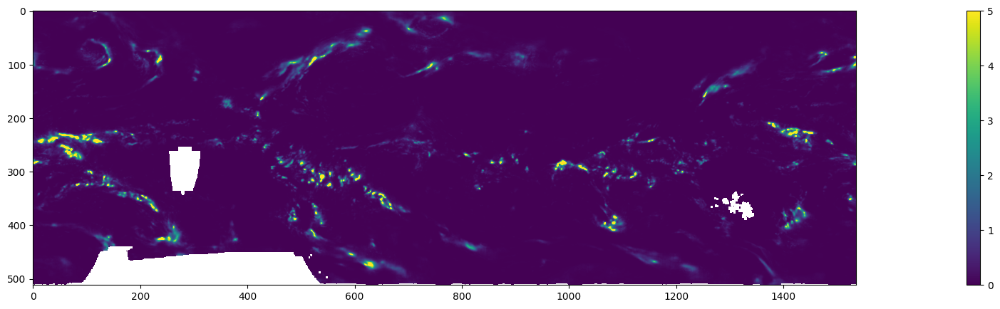

In [ ]:
plt.figure(figsize=(40,5))
plt.imshow(pred[200,:,:])
plt.colorbar()
plt.clim(0,5)

In [ ]:
# Create noise
epsilon = 1e-7  # or any other small value
size = 20  # size of the noise vector
# Generate noise
noise = np.random.uniform(epsilon, 2 * epsilon, size)
# Ensure uniqueness and positivity
unique_noise = np.unique(noise)
while len(unique_noise) < size:
    extra_noise = np.random.uniform(epsilon, 2 * epsilon, size - len(unique_noise))
    unique_extra_noise = np.setdiff1d(extra_noise, unique_noise)  # Ensure new noise values are unique
    unique_noise = np.concatenate((unique_noise, unique_extra_noise))
# Sort the noise
sorted_noise = np.sort(unique_noise)
sorted_noise[0]=0.0

In [ ]:
# Calculate quantiles
Satellite_quantiles = np.zeros([20,512,1536])

for lat in range(pred.shape[1]):
    for lon in range(pred.shape[2]):
        predi = pred[:, lat, lon]
        tmpi = xtrain1[:,lat,lon]
        predi = predi[tmpi>0]
        quantilei = np.nanpercentile(predi,  q=[0,29.63,50.49,65.18,75.52,82.80,87.93,91.54,94.08,95.87,97.13,98.02,98.64,99.08,99.39,99.61,99.76,99.87,99.95,100], axis=0)  # Calculate quantiles along the time dimension
        if np.isnan(quantilei).any():
           Satellite_quantiles[:, lat, lon] = sorted_noise
        else:
           Satellite_quantiles[:, lat, lon] = quantilei + sorted_noise

Satellite_quantiles[0,...] = 0.0
pred_100= pred[0:100,:,:]

/usr/local/lib/python3.10/dist-packages/numpy/lib/nanfunctions.py:1562: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


In [ ]:
np.save(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/QMA/pred_100{MON}.npy',pred_100)
np.save(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/QMA/Satellite_quantiles{MON}.npy',Satellite_quantiles)

In [ ]:
plt.figure(figsize=(40,5))
plt.imshow(Satellite_quantiles[19,:,:])
plt.colorbar()
plt.clim(0,20)

## Convert QBS Quantiles from .Mat to .Npy

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
fn= f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/OBS_Quantiles{MON}_corrected.mat'
observed_quantiles = mat73.loadmat(fn)['OBS_Quantiles']
np.save(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/QMA/Obs_quantiles{MON}.npy',observed_quantiles)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# BUILD 3D INTERPOLATION MODEL

In [ ]:
observed_quantiles= np.load(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/QMA/Obs_quantiles{MON}.npy')
satellite_quantiles= np.load(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/QMA/Satellite_quantiles{MON}.npy')
pred_100= np.load(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/QMA/pred_100{MON}.npy')


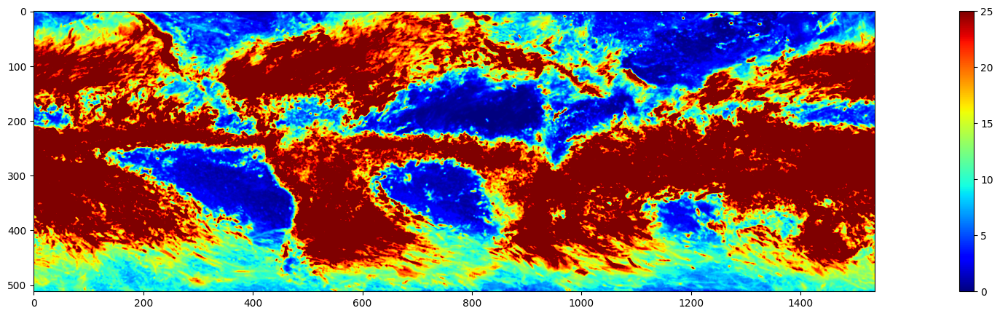

In [ ]:
a=19
plt.figure(figsize=(30,5))
plt.imshow(observed_quantiles[a],'jet')
plt.colorbar()
plt.clim(0,25)

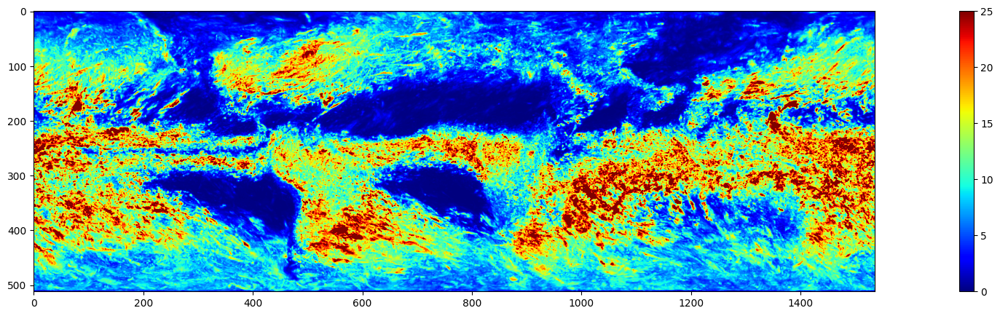

In [ ]:
plt.figure(figsize=(30,5))
plt.imshow(satellite_quantiles[a],'jet')
plt.colorbar()
plt.clim(0,25)

In [ ]:
def apply_mapping_function(future_satellite_estimate, satellite_quantiles, observed_quantiles):

    # Create a mask indicating where interpolation should be performed (i.e., where future_satellite_estimate is non-zero)
    non_zero_mask = future_satellite_estimate >0.01

    # Get the indices where the mask is True
    lat_indices, lon_indices = np.where(non_zero_mask)
    corrected_estimate = np.copy(future_satellite_estimate)

    # Interpolate along the first axis (quantiles) for each non-zero pixel
    for lat, lon in zip(lat_indices, lon_indices):
        # Extract quantile arrays for the current pixel
        sat_quantiles = satellite_quantiles[:, lat, lon]
        obs_quantiles = observed_quantiles[:, lat, lon]
        # Perform interpolation
        corrected_estimate[lat, lon] = np.interp(future_satellite_estimate[lat, lon], sat_quantiles, obs_quantiles, left=obs_quantiles[0], right=obs_quantiles[-1])

    return corrected_estimate

In [ ]:
corrected_estimate = apply_mapping_function(pred_100[0,:,:],satellite_quantiles,observed_quantiles)

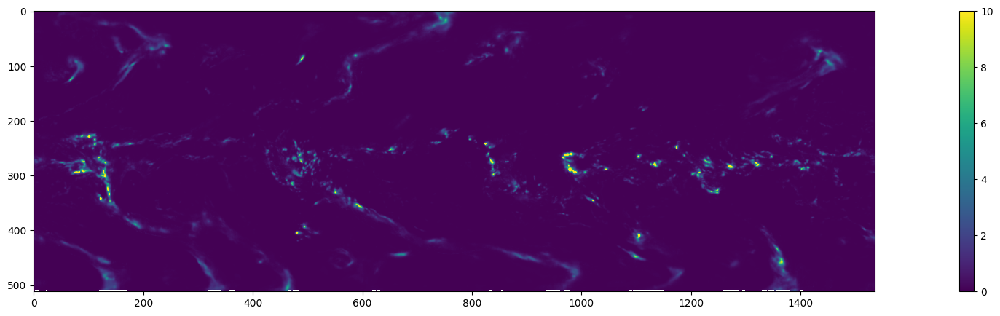

In [ ]:
plt.figure(figsize=(30,5))
plt.imshow(pred_100[0])
plt.colorbar()
plt.clim(0,10)

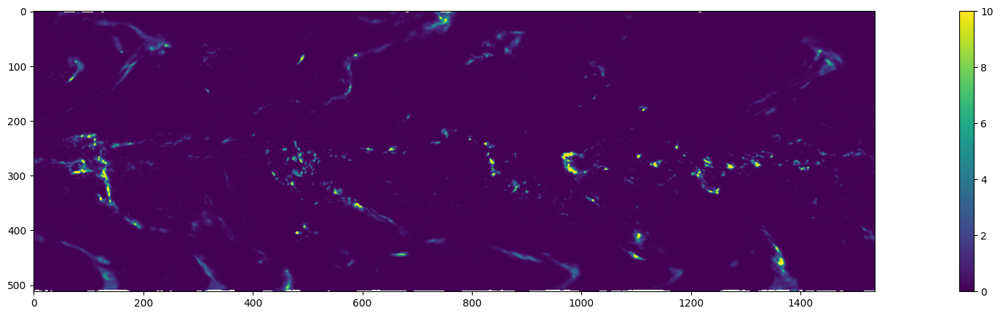

In [ ]:
plt.figure(figsize=(30,5))
plt.imshow(corrected_estimate)
plt.colorbar()
plt.clim(0,10)

In [ ]:
corrected_pred=[]
for i in range(100):
  corrected_estimates = apply_mapping_function(pred_100[i,:,:],satellite_quantiles,observed_quantiles)
  corrected_pred.append(corrected_estimates)
  print(i)


In [ ]:
print(np.nanmax(pred_100),np.nanmax(corrected_pred))

34.25 50.72


In [ ]:
print(np.nanmean(pred_100),np.nanmean(corrected_pred))

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


inf inf


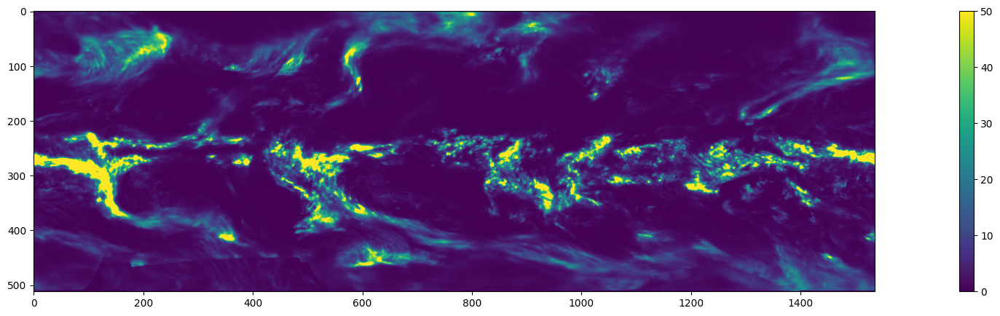

In [ ]:
plt.figure(figsize=(30,5))
plt.imshow(np.nansum(pred_100,axis=0)/2)
plt.colorbar()
plt.clim(0,50)

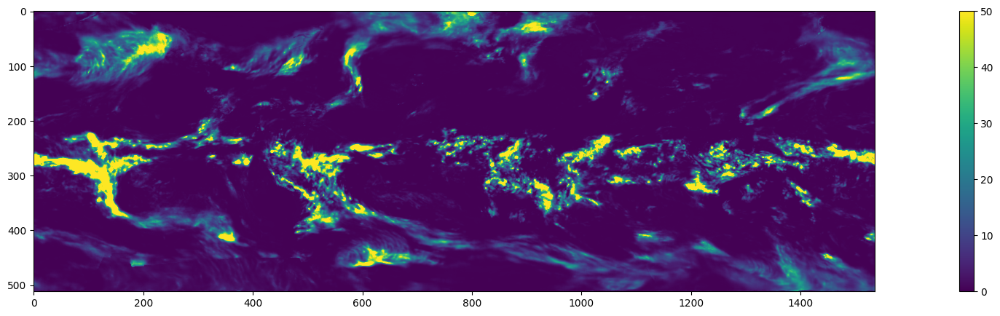

In [ ]:
plt.figure(figsize=(30,5))
plt.imshow(np.nansum(corrected_pred,axis=0)/2)
plt.colorbar()
plt.clim(0,50)

# APPLY FOR 1 MONTH INDEPENDENT DATA 2022

In [ ]:
# Load data
import keras
observed_quantiles= np.load(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/QMA/Obs_quantiles{MON}.npy')
satellite_quantiles= np.load(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/QMA/Satellite_quantiles{MON}.npy')

In [ ]:
def apply_mapping_function(future_satellite_estimate, satellite_quantiles, observed_quantiles):

    # Create a mask indicating where interpolation should be performed (i.e., where future_satellite_estimate is non-zero)
    non_zero_mask = future_satellite_estimate > 0.01

    # Get the indices where the mask is True
    lat_indices, lon_indices = np.where(non_zero_mask)
    corrected_estimate = np.copy(future_satellite_estimate)

    # Interpolate along the first axis (quantiles) for each non-zero pixel
    for lat, lon in zip(lat_indices, lon_indices):
        # Extract quantile arrays for the current pixel
        sat_quantiles = satellite_quantiles[:, lat, lon]
        obs_quantiles = observed_quantiles[:, lat, lon]
        # Perform interpolation
        corrected_estimate[lat, lon] = np.interp(future_satellite_estimate[lat, lon], sat_quantiles, obs_quantiles, left=obs_quantiles[0], right=obs_quantiles[-1])

    return corrected_estimate

In [ ]:
# load model
import keras
model=keras.models.load_model(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Models/UnetGlobal_Model{MON}.h5')

fn= f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/IR_val{MON}_22.mat'
mat = mat73.loadmat(fn)['IR']
n=mat.shape[2]
xtrain1 = np.zeros([n,512,1536], dtype=np.uint8)
for i in range(n):
   xtrain1[i,:,:]=mat[:,:,i]
mat=[]
xtrain1.shape

fn= f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/RAIN_{MON}.mat'
mat = mat73.loadmat(fn)['RAIN']
xtrain2 = np.reshape(mat,[1,512,1536])
xtrain2 = np.repeat(xtrain2, n, axis=0)
xtrain2.shape

fn= f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/MW_val{MON}_22.mat'
mat = mat73.loadmat(fn)['MW']
ytrain = np.zeros([n,512,1536], dtype=np.single)
for i in range(n):
   ytrain[i,:,:]=mat[:,:,i]
mat=[]
ytrain.shape

test=np.stack([xtrain1,xtrain2,ytrain],-1)
print(test.shape)
xtrain1,xtrain2,ytrain=[],[],[]

(1488, 512, 1536, 3)


In [ ]:
BATCH_SIZE = 1
def data_generator(data):
    for i in range(data.shape[0]):
        yield data[i]

def load(input):
  input_image = tf.convert_to_tensor(tf.reshape((input[...,0:2]-1)/254.0,[512,1536,2]))
  real_image = tf.convert_to_tensor(tf.reshape(input[...,2],[512,1536,1]))
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)
  return input_image, real_image

def load_image_train(image_file):
  input_image, real_image = load(image_file)
  return input_image, real_image

def load_image_test(image_file):
  input_image, real_image = load(image_file)
  return input_image, real_image

test_dataset = tf.data.Dataset.from_generator(lambda: data_generator(test), output_types=tf.float32)
test_dataset = test_dataset.map(load_image_test, num_parallel_calls=tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [ ]:
pred = []
pred1 = []
for inp, tar in test_dataset:
    prediction = model(inp, training=True)
    prediction = np.array(prediction[0, ..., 0])
    prediction1 = apply_mapping_function(prediction,satellite_quantiles,observed_quantiles)
    prediction1[prediction1<0] = 0
    ir = np.array(inp[0,...,0])
    prediction1[ir<0]=np.nan
    pred.append(np.array(prediction))
    pred1.append(np.array(prediction1))


pred = np.array(pred)
pred1 = np.array(pred1)

In [ ]:
obs= test[...,2]
obs[obs<0]=np.nan
obs_sum3=np.sum(obs,axis = 0)

In [ ]:
print(np.nansum(pred))
print(np.nansum(obs))
check = np.nansum(obs)/np.nansum(pred)
print(check)

115099510.0
121055540.0
1.0517467


In [ ]:
print(np.nansum(pred1))
print(np.nansum(obs))
check = np.nansum(obs)/np.nansum(pred1)
print(check)

114666824.0
121055540.0
1.0557154


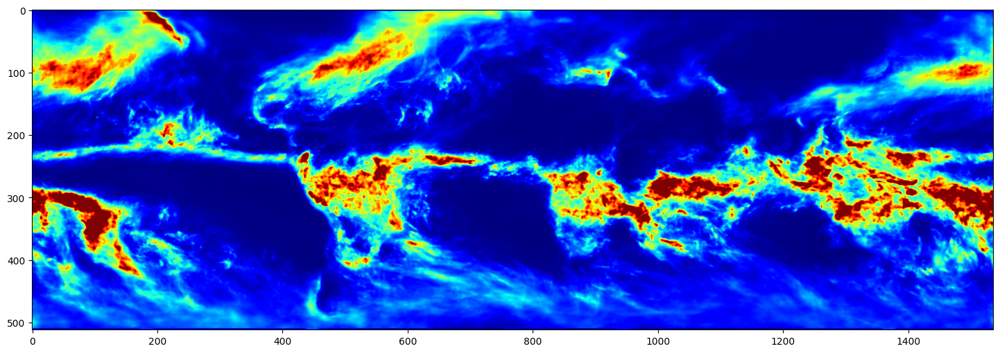

In [ ]:
plt.figure(figsize = (18,6))
plt.imshow(np.nansum(pred,axis=0)/2,'jet')
plt.clim(0,350)

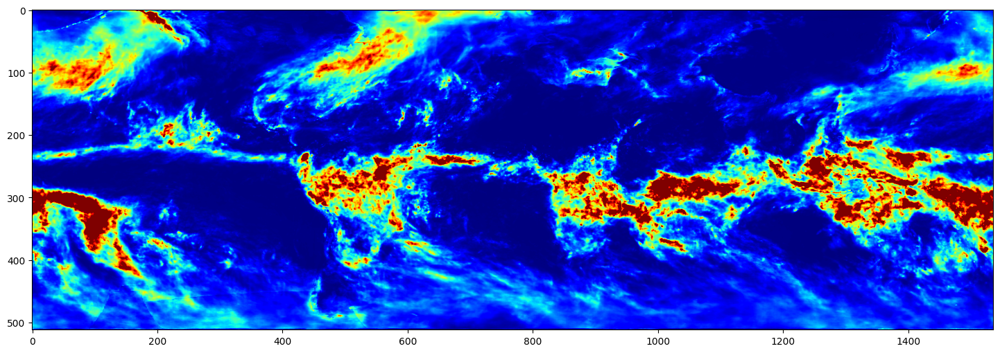

In [ ]:
plt.figure(figsize = (18,6))
plt.imshow(np.nansum(pred1,axis=0)/2,'jet')
plt.clim(0,350)

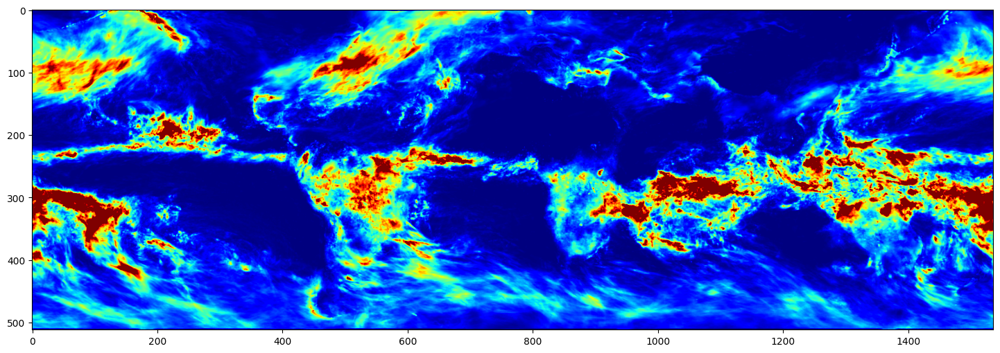

In [ ]:
plt.figure(figsize = (18,6))
plt.imshow(np.nansum(obs,axis=0)/2,'jet')
plt.clim(0,350)

In [ ]:
temp=np.nansum(obs,axis=0)/2

In [ ]:
np.nanmax(temp)

1134.768

In [ ]:
temp1=np.nansum(pred,axis=0)/2

In [ ]:
np.max(temp1)

906.6725

In [ ]:
temp2=np.nansum(pred1,axis=0)/2

In [ ]:
np.max(temp2)

1014.9838

In [ ]:
np.nanmean(temp)

76.964745

In [ ]:
np.nanmean(temp1)

73.17791

In [ ]:
np.nanmean(temp2)

72.90258

In [ ]:
threshold = 1000

In [ ]:
indices = np.where(temp2 > threshold)

# Print the result
print("Indices of pixels with values larger than", threshold, ":")
print(indices)

Indices of pixels with values larger than 1000 :
(array([334, 334]), array([977, 978]))


In [ ]:
a=pred1[:,334,977]

In [ ]:
b=obs[:,334,977]

In [ ]:
c=pred[:,334,977]

In [ ]:
d=satellite_quantiles[:,334,977]
e=observed_quantiles[:,334,977]

In [ ]:
plt.plot(d)

In [ ]:
plt.plot(e)

In [ ]:
plt.plot(a)


In [ ]:
plt.plot(b)

In [ ]:
print(np.mean(c))

nan


In [ ]:
plt.plot(c)

In [ ]:
from google.colab import runtime
runtime.unassign()

## LINEAR SCALING BIAS CORRECTION

In [ ]:
import tensorflow as tf
import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
from IPython import display
!pip install mat73
import mat73
import numpy as np
from tensorflow import keras
from tensorflow.keras.optimizers import Adam

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
MON='12'
monidx=int(MON)-1

import cv2

fn= '/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/Rainmonthly20162021.mat'
RainMonMean = mat73.loadmat(fn)['RainMonMean']

AccumulateMon= np.load(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/Accumulation{MON}.npy')
AccumulateMon=cv2.resize(AccumulateMon, (9000, 3000), interpolation=cv2.INTER_LINEAR)

LS_coef = RainMonMean[...,monidx]/(AccumulateMon/2/6)# half hourly for 6 years
LS_coef=LS_coef*1.1
LS_coef[LS_coef>2.0] = 2.0
LS_coef[LS_coef<0.5] = 0.5

LS_coef[np.isnan(LS_coef)] = 1

print(np.mean(LS_coef))

nan_indices = np.isnan(LS_coef)
LS_coef[nan_indices] = 1

inf_indices = np.isinf(LS_coef)
LS_coef[inf_indices] = 1

LS_coef = LS_coef.astype('float16')

np.save(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/QMA/LS_coef{MON}.npy',LS_coef)

1.0042358154910005


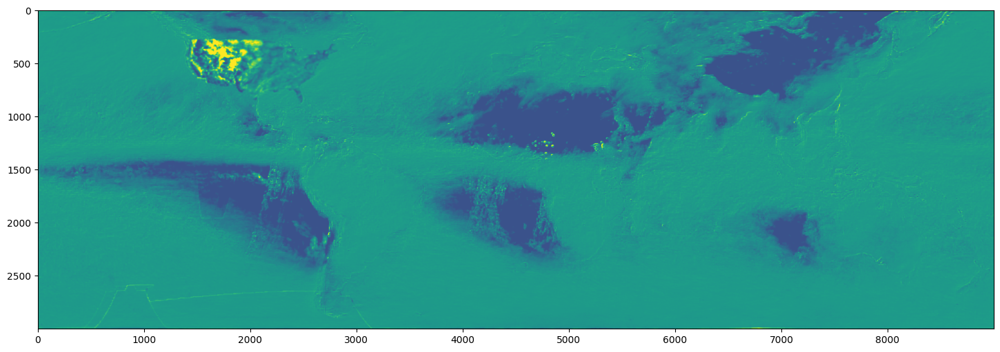

In [ ]:
plt.figure(figsize = (18,6))
plt.imshow(LS_coef)
plt.clim(0,2)

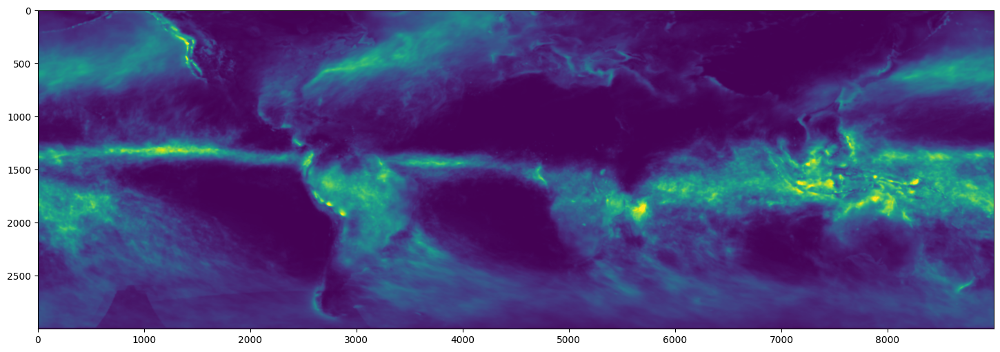

In [ ]:
plt.figure(figsize = (18,6))
plt.imshow(RainMonMean[...,0])
plt.clim(0,500)

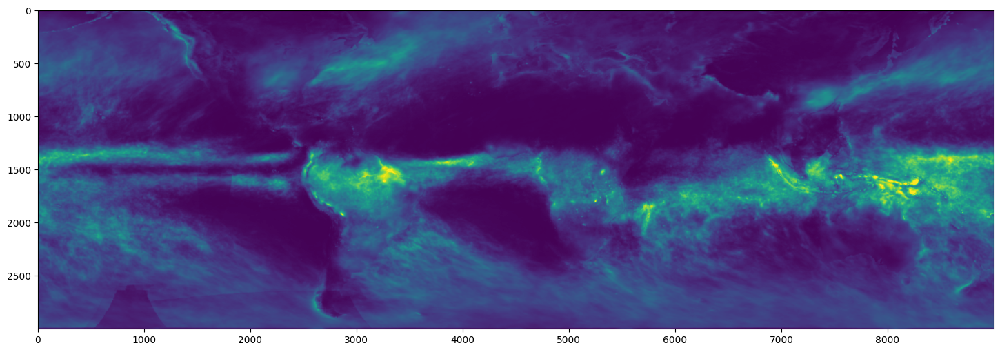

In [ ]:
plt.figure(figsize = (18,6))
plt.imshow(AccumulateMon/2/6)
plt.clim(0,500)

## PROCESS CAP PRECIPITATION

In [ ]:
fn= '/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/Rain1hmax04_punet.mat'
Rain1hmax04 = mat73.loadmat(fn)['Rain1hmax04']

In [ ]:
## NOTE !!!!!!!
Rain1hmax04=Rain1hmax04[...,monidx]

In [ ]:
np.save(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/QMA/Rain1hmax{MON}.npy',Rain1hmax04)

## APPLY CORRECTION COEFFICIENTS TO HIGH RESOLUTION DATA 100 IMAGES OF 2022

In [ ]:
import tensorflow as tf
import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
from IPython import display
!pip install mat73
import mat73
import numpy as np
import pandas as pd
##
from google.colab import drive
drive.mount('/content/drive')
# load model
import keras
model=keras.models.load_model(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Models/UnetGlobal_Model{MON}.h5')
##
n=100
fn= f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/IR_val{MON}_100.mat'
mat = mat73.loadmat(fn)['IR']
##
xtrain1 = np.zeros([n,512,1536], dtype=np.uint8)
for i in range(n):
   xtrain1[i,:,:]=mat[:,:,i]
mat=[]
##
from scipy import ndimage, misc
fn= f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/RAIN_{MON}.mat'
mat = mat73.loadmat(fn)['RAIN']
xtrain2 = np.reshape(mat,[1,512,1536])
xtrain2 = np.repeat(xtrain2, n, axis=0)
xtrain2.shape
##
fn= f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/MW_val{MON}_100.mat'
mat = mat73.loadmat(fn)['MW']
ytrain = np.zeros([n,512,1536], dtype=np.single)
for i in range(n):
   ytrain[i,:,:]=mat[:,:,i]
mat=[]
##
test=np.stack([xtrain1,xtrain2,ytrain],-1)
print(test.shape)
xtrain1,xtrain2,ytrain=[],[],[]
##
fn= f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/IR_hires{MON}.mat'
mat = mat73.loadmat(fn)['IR']
print(mat.shape)
xtrain1_hires= np.zeros([n,3000,9000], dtype=np.uint8)
for i in range(n):
   xtrain1_hires[i,:,:]=mat[:,:,i]
mat=[]
##
fn= f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/Data/MW_hires{MON}.mat'
mat = mat73.loadmat(fn)['MW']
ytrain_hires = np.zeros([n,3000,9000], dtype=np.single)
for i in range(n):
   ytrain_hires[i,:,:]=mat[:,:,i]
mat=[]
##


BATCH_SIZE = 1
def data_generator(data):
    for i in range(data.shape[0]):
        yield data[i]

def load(input):
  input_image = tf.convert_to_tensor(tf.reshape((input[...,0:2]-1)/254.0,[512,1536,2]))
  real_image = tf.convert_to_tensor(tf.reshape(input[...,2],[512,1536,1]))
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)
  return input_image, real_image

def load_image_train(image_file):
  input_image, real_image = load(image_file)
  return input_image, real_image

def load_image_test(image_file):
  input_image, real_image = load(image_file)
  return input_image, real_image

test_dataset = tf.data.Dataset.from_generator(lambda: data_generator(test), output_types=tf.float32)
test_dataset = test_dataset.map(load_image_test, num_parallel_calls=tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(BATCH_SIZE)

##
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)

  display_list = [test_input[0,...,0], tar[0,...,0], prediction[0,...,0]]
  title = ['IR', 'IMERGF', 'Prediction']

  plt.figure(figsize=(16,2))
  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    plt.imshow(display_list[i])
    if i==1:
      plt.colorbar()
      plt.clim(0,5)
    elif i==2:
      plt.colorbar()
      plt.clim(0,5)
    else:
      plt.colorbar()
    plt.axis('off')
  plt.tight_layout()
  plt.show()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
(100, 512, 1536, 3)
(3000, 9000, 100)


In [ ]:
def apply_mapping_function(future_satellite_estimate, satellite_quantiles, observed_quantiles):
    # Create a mask indicating where interpolation should be performed (i.e., where future_satellite_estimate is non-zero)
    non_zero_mask = future_satellite_estimate > 0.01

    # Get the indices where the mask is True
    lat_indices, lon_indices = np.where(non_zero_mask)
    corrected_estimate = np.copy(future_satellite_estimate)

    # Interpolate along the first axis (quantiles) for each non-zero pixel
    for lat, lon in zip(lat_indices, lon_indices):
        # Extract quantile arrays for the current pixel
        sat_quantiles = satellite_quantiles[:, lat, lon]
        obs_quantiles = observed_quantiles[:, lat, lon]
        # Perform interpolation
        corrected_estimate[lat, lon] = np.interp(future_satellite_estimate[lat, lon], sat_quantiles, obs_quantiles, left=obs_quantiles[0], right=obs_quantiles[-1])

    return corrected_estimate

In [ ]:
# Load data
import keras
observed_quantiles= np.load(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/QMA/Obs_quantiles{MON}.npy')
satellite_quantiles= np.load(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/QMA/Satellite_quantiles{MON}.npy')

In [ ]:
# Load linear scaling coefficients
LS_coef= np.load(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/QMA/LS_coef{MON}.npy')
# Load max hourly rain rates
Rain1hmax04= np.load(f'/content/drive/MyDrive/ColabNotebooks/UNetGlobal/QMA/Rain1hmax{MON}.npy')

In [ ]:
pred = []
pred1 = []

for inp, tar in test_dataset:
    prediction = model(inp, training=True)
    prediction = np.array(prediction[0, ..., 0])
    prediction1 = apply_mapping_function(prediction,satellite_quantiles,observed_quantiles)
    prediction1[prediction1<0] = 0
    ir = np.array(inp[0,...,0])
    prediction1[ir<0]=np.nan

    pred.append(np.array(prediction))
    pred1.append(np.array(prediction1))

pred = np.array(pred)
pred1 = np.array(pred1)

In [ ]:
obs= test[...,2]
obs[obs<0]=0

In [ ]:
import cv2
import numpy as np

# Perform guided filtering
radius = 5  # Adjust the radius of the filtering window as needed
epsilon = 1e-3  # Adjust the regularization parameter as needed
pred_inter = []
pred_adjust = []

for i in range(100):
    # Convert xtrain1_hires[i] to float32 if it's not already
    guide_image = xtrain1_hires[i].astype(np.float32)

    # Resize interpolated_precip_data
    interpolated_precip_data = cv2.resize(pred1[i], (9000, 3000), interpolation=cv2.INTER_LINEAR)

    # Linear Scaling
    interpolated_precip_data = interpolated_precip_data* LS_coef

    # Apply cap values
    interpolated_precip_data[interpolated_precip_data>Rain1hmax04] =Rain1hmax04[interpolated_precip_data>Rain1hmax04]

    # Convert interpolated_precip_data to float32
    interpolated_precip_data = interpolated_precip_data.astype(np.float32)

    # Avoid nans
    nan_indices = np.isnan(interpolated_precip_data)
    interpolated_precip_data[nan_indices]=0

    # Apply guided filtering using the weighted precipitation data
    pred_adj= cv2.ximgproc.guidedFilter(guide=guide_image, src=interpolated_precip_data, radius=radius, eps=epsilon)

    pred_adj[nan_indices]=np.nan

    # Append pred_adj to pred_adjust
    pred_adjust.append(pred_adj)

    # Append original interpolated_precip_data to pred_inter
    pred_inter.append(interpolated_precip_data)

pred_adjust = np.array(pred_adjust)
pred_inter = np.array(pred_inter)


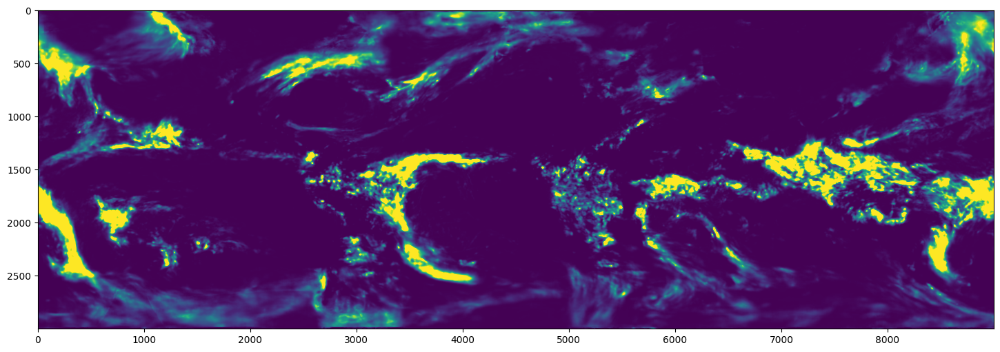

In [ ]:
plt.figure(figsize = (18,6))
plt.imshow(np.nansum(pred_inter,axis=0))
plt.clim(0,100)

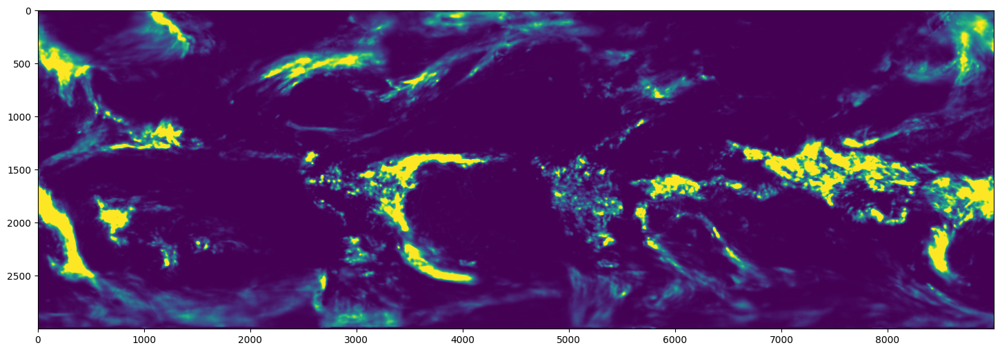

In [ ]:
plt.figure(figsize = (18,6))
plt.imshow(np.nansum(pred_adjust,axis=0))
plt.clim(0,100)

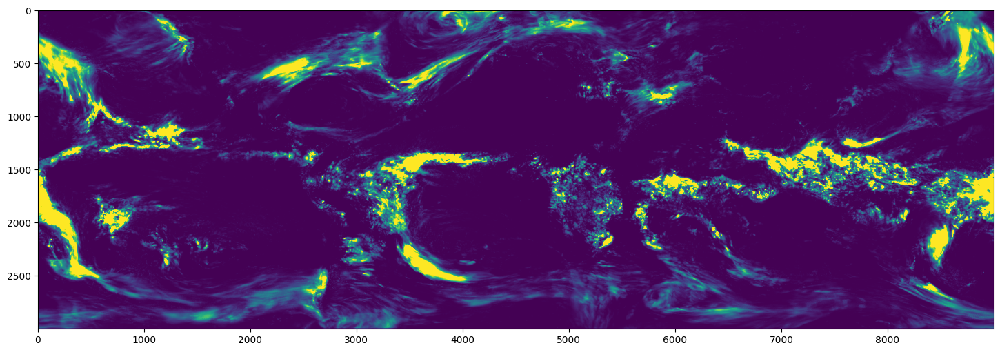

In [ ]:
plt.figure(figsize = (18,6))
plt.imshow(np.sum(ytrain_hires,axis=0))
plt.clim(0,100)

In [ ]:
print(np.nanmean(pred_inter))
print(np.nanmean(pred_adjust))
print(np.nanmean(ytrain_hires))
print(np.nanmean(pred))
print(np.nanmean(pred1))

0.12854071
0.12904555
0.12293615
0.12225305
0.120645665


In [ ]:
print(np.nansum(pred_inter))
print(np.nansum(pred_adjust))
print(np.nansum(ytrain_hires[0:100]))
check = np.nansum(pred_adjust)/np.sum(ytrain_hires[0:100])
print(check)

347059940.0
346719970.0
331927600.0
1.044565


In [ ]:
print(np.nanmax(pred))
print(np.nanmax(pred_inter))
print(np.nanmax(pred_adjust))
print(np.nanmax(ytrain_hires))

33.15129
64.22454
40.5609
73.002304


In [ ]:
for j in range(25):
  display=[pred_inter[j],pred_adjust[j],ytrain_hires[j], xtrain1_hires[j]]
  plt.figure(figsize = (24,6))
  for i in range(4):
    plt.subplot(1, 4, i+1)
    plt.imshow(display[i][1500:2500,3000:4000])
    if i==0:
      plt.clim(0,5)
    elif i==1:
      plt.clim(0, 5)
    elif i==2:
      plt.clim(0, 5)
    elif i==3:
      plt.clim(0, 200)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import numpy as np
from sklearn.metrics import mean_squared_error
y_true = ytrain_hires.flatten().astype(np.float16)
y_pred = pred_adjust.flatten().astype(np.float16)

rmse = np.sqrt(mean_squared_error(y_true,y_pred))
mae = np.mean(np.abs(y_true-y_pred))
corr_coefficient = np.corrcoef(y_true, y_pred)[0, 1]
print(f"Test Loss (MSE): {rmse}, MAE: {mae}, Correlation: {corr_coefficient}")

In [ ]:
# Set a precipitation threshold (e.g., 0.5) to convert predictions to binary values
threshold = 0.1

# Convert predictions to binary using the threshold
y_pred_binary = [1 if pred >= threshold else 0 for pred in y_pred]
y_true_binary = [1 if ytrue >= threshold else 0 for ytrue in y_true]

# Calculate True Positives (TP), False Positives (FP), True Negatives (TN), and False Negatives (FN)
TP = sum((y_true_binary[i] == 1) and (y_pred_binary[i] == 1) for i in range(len(y_true)))
FP = sum((y_true_binary[i] == 0) and (y_pred_binary[i] == 1) for i in range(len(y_true)))
TN = sum((y_true_binary[i] == 0) and (y_pred_binary[i] == 0) for i in range(len(y_true)))
FN = sum((y_true_binary[i] == 1) and (y_pred_binary[i] == 0) for i in range(len(y_true)))

# Calculate Probability of Detection (POD), False Alarm Ratio (FAR), and Critical Success Index (CSI)
POD = TP / (TP + FN)
FAR = FP / (FP + TP)
CSI = TP / (TP + FN + FP)


print(f"Probability of Detection (POD): {POD}")
print(f"False Alarm Ratio (FAR): {FAR}")
print(f"Critical Success Index (CSI): {CSI}")